# Advance Lane Lines Detector
## Self-Driving Car Nanodegree at Udacity
---
In this project we will detect lane lines of a road that is recorded by a camera installed on a car driving at the road. We assume that this camera is placed at the center of the car. As the first step the camera should be calibrated using the chessboard images and also the warp transform matrices will be determined afterward. By applying HSV-filter lane lines will be detected. Beside of the detection lane lines, we try to calculate curvature of road through finding the polynomial of each side's line. Also concidering the U.S road regulations we convert pixels to real world distance measurements. Along all this step the visualization process helps us figure out how our pipeline works.

Let us first start with importing packages that is needed to this project and then calibrate camera.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob
import time
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

### Camera Calibration
---

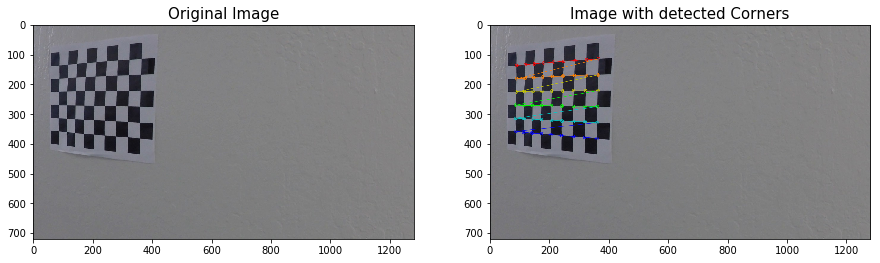

In [2]:
### calibrate camera using images find in omage_path path
# chess_size is a tuple variable define (X,Y) size of chessboard in images
# show is flag for drawing images and founded corners on it

chess_size = (9, 6)
chess_xsize = chess_size[0]
chess_ysize = chess_size[1]

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chess_xsize*chess_ysize,3), np.float32)
objp[:,:2] = np.mgrid[0:chess_xsize,0:chess_ysize].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane

# Make a list of calibration images
images_path = 'camera_cal/calibration*.jpg'
images_list = glob.glob(images_path)

# Step through the list and search for chessboard corners
for fname in images_list:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, chess_size, None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

f, axes= plt.subplots(1,2,figsize=(15,30))
# Plotting the original Image
axes[0].set_title('Original Image', fontsize=15)
axes[0].imshow(img[:,:,::-1])
#plot and display image with detected corners
img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
axes[1].set_title('Image with detected Corners', fontsize=15)
axes[1].imshow(img[:,:,::-1])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

### Undistorted Images
---

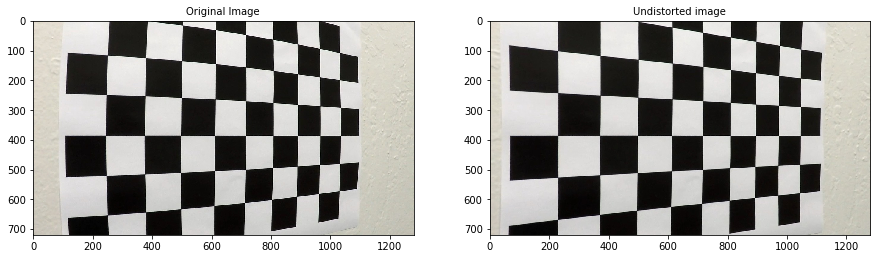

In [3]:
f, axes= plt.subplots(1,2,figsize=(15,30))
img = cv2.imread('camera_cal/calibration5.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
axes[0].set_title('Original Image', fontsize=10)
axes[0].imshow(img[:,:,::-1])
axes[1].set_title('Undistorted image', fontsize=10)
axes[1].imshow(dst[:,:,::-1])

### Perspective Transform
---

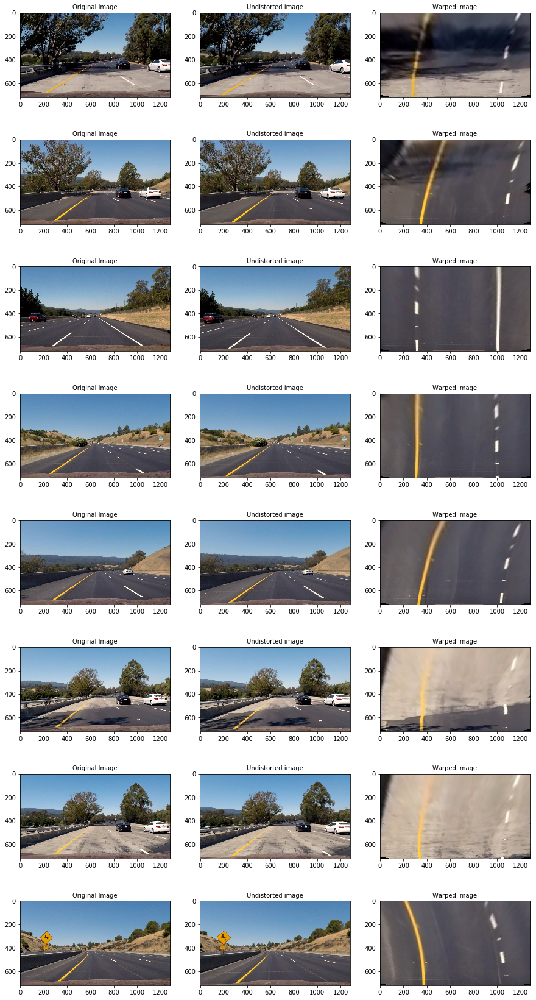

In [4]:
# src and dst for perspective transform
src = np.float32([[583,455],[219,690],[1059,690],[695,455]])
dst = np.float32([[280,0],[280,720],[1000,720],[1000,0]])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

# Make a list of test images
images_path = 'test_images/*.jpg'
images_list = glob.glob(images_path)
f, axes= plt.subplots(len(images_list),3,figsize=(15,30))
for counter, fname in enumerate(images_list):
    img = cv2.imread(fname)
    axes[counter, 0].set_title('Original Image', fontsize=10)
    axes[counter, 0].imshow(img[:,:,::-1])
    
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    axes[counter, 1].set_title('Undistorted image', fontsize=10)
    axes[counter, 1].imshow(dst[:,:,::-1])
    
    warped_img = cv2.warpPerspective(dst, M, dst.shape[-2::-1], flags=cv2.INTER_LINEAR)
    axes[counter, 2].set_title('Warped image', fontsize=10)
    axes[counter, 2].imshow(warped_img[:,:,::-1])

### Binary Image
---
#### Yellow and white colors detection in HSV colorspace

In [5]:
def hsv_filter(image):
    ###hsv_filter
    #yellow and white upper and lower thresholds
    lower_ylw = np.array([15,70,140])
    upper_ylw = np.array([30,255,255])
    lower_wht = np.array([0,0,200])
    upper_wht = np.array([180,30,255])

    hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    #select yellow areas
    mask_ylw = cv2.inRange(hsv_img, lower_ylw, upper_ylw)
    #select white areas
    mask_wht = cv2.inRange(hsv_img, lower_wht, upper_wht)
    #combine to white and yellow masks together
    color_filtered = cv2.bitwise_or(mask_ylw, mask_wht)
    color_filtered[color_filtered != 0] = 1
    
    return color_filtered

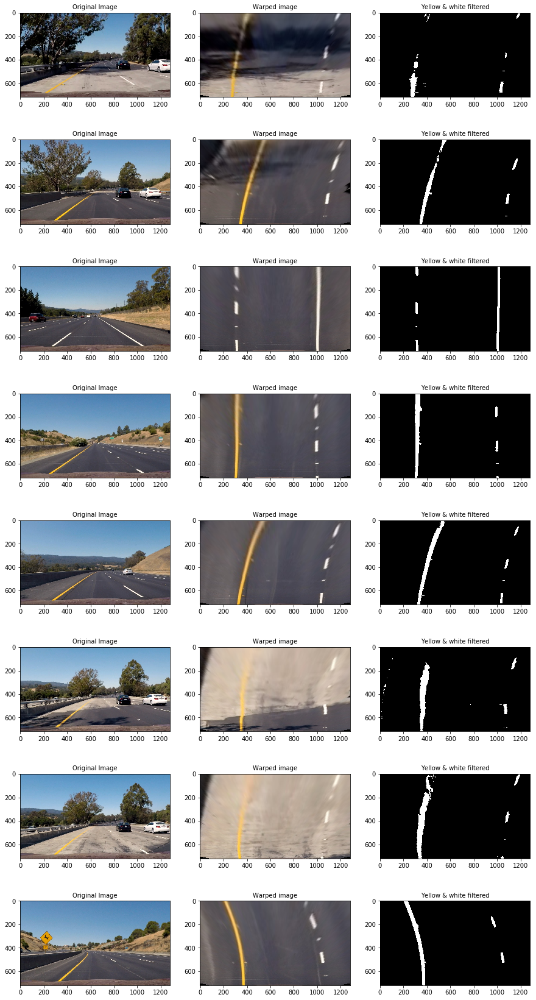

In [6]:
# Make a list of test images
images_path = 'test_images/*.jpg'
images_list = glob.glob(images_path)
f, axes= plt.subplots(len(images_list),3,figsize=(15,30))
for counter, fname in enumerate(images_list):
    img = cv2.imread(fname)
    axes[counter, 0].set_title('Original Image', fontsize=10)
    axes[counter, 0].imshow(img[:,:,::-1])
    
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    warped_img = cv2.warpPerspective(dst, M, dst.shape[-2::-1], flags=cv2.INTER_LINEAR)
    axes[counter, 1].set_title('Warped image', fontsize=10)
    axes[counter, 1].imshow(warped_img[:,:,::-1])
    
    binarized_img = hsv_filter(warped_img)
    axes[counter, 2].set_title('Yellow & white filtered', fontsize=10)
    axes[counter, 2].imshow(binarized_img*255, cmap="gray")

#### Sobel

In [7]:
def sobel_x(image, sx_thresh=(20, 100)):
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Take the derivative in x
    sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobelx = np.absolute(sobelx)
    
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    return sxbinary

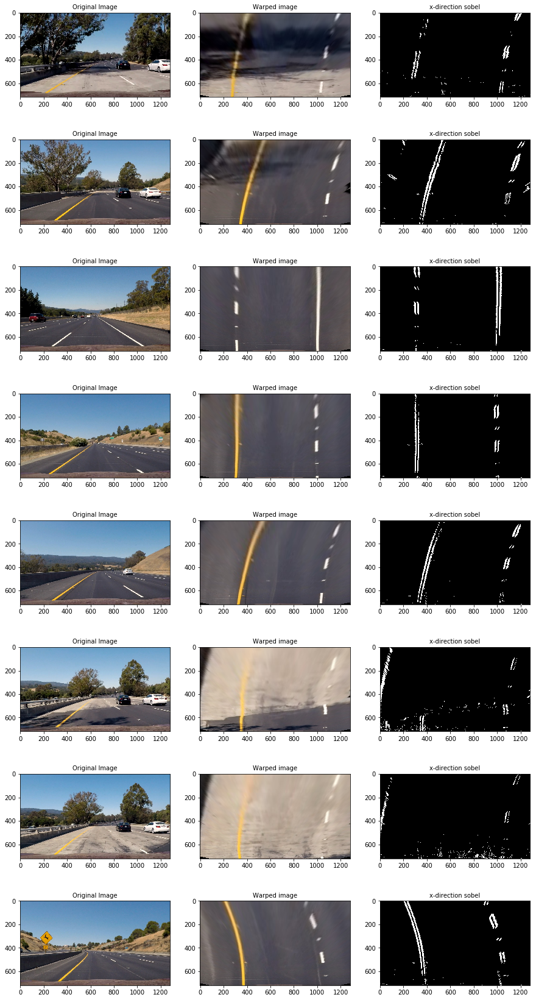

In [8]:
# Make a list of test images
images_path = 'test_images/*.jpg'
images_list = glob.glob(images_path)
f, axes= plt.subplots(len(images_list),3,figsize=(15,30))
for counter, fname in enumerate(images_list):
    img = cv2.imread(fname)
    axes[counter, 0].set_title('Original Image', fontsize=10)
    axes[counter, 0].imshow(img[:,:,::-1])
    
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    warped_img = cv2.warpPerspective(dst, M, dst.shape[-2::-1], flags=cv2.INTER_LINEAR)
    axes[counter, 1].set_title('Warped image', fontsize=10)
    axes[counter, 1].imshow(warped_img[:,:,::-1])
    
    binarized_img = sobel_x(warped_img, (20,100))
    axes[counter, 2].set_title('x-direction sobel', fontsize=10)
    axes[counter, 2].imshow(binarized_img*255, cmap="gray")

#### Combination color filter and sobel mask

In [9]:
def binary_image(image, sx_thresh=(20,100)):
    sx_binary = sobel_x(image, sx_thresh)
    hsv_binary = hsv_filter(image)
    combined_binary = sx_binary | hsv_binary
    return combined_binary

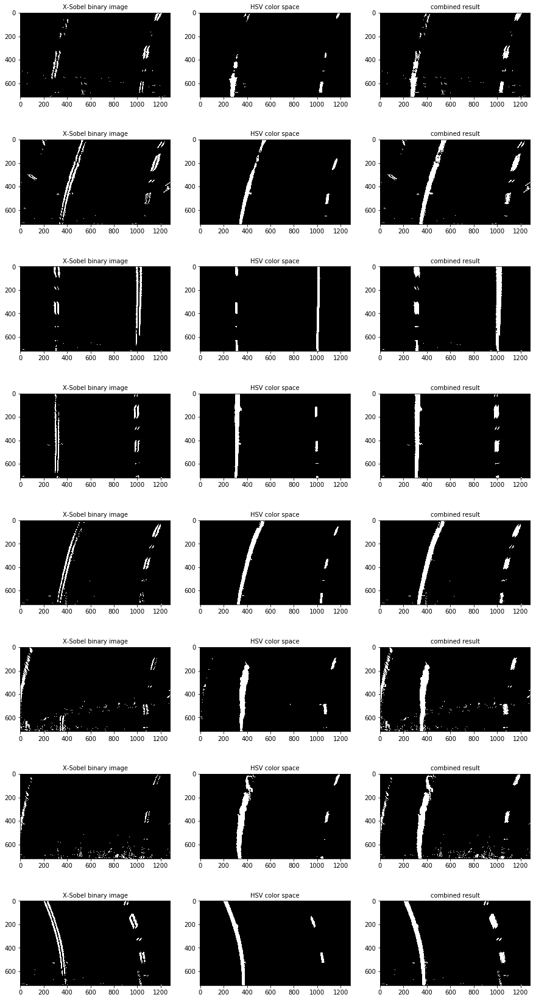

In [10]:
# Make a list of test images
images_path = 'test_images/*.jpg'
images_list = glob.glob(images_path)
f, axes= plt.subplots(len(images_list),3,figsize=(15,30))
for counter, fname in enumerate(images_list):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    warped_img = cv2.warpPerspective(dst, M, dst.shape[-2::-1], flags=cv2.INTER_LINEAR)
    
    sx_binary = sobel_x(warped_img, (20,100))
    axes[counter, 0].set_title('X-Sobel binary image', fontsize=10)
    axes[counter, 0].imshow(sx_binary*255, cmap="gray")
    
    hsv_binary = hsv_filter(warped_img)
    axes[counter, 1].set_title('HSV color space', fontsize=10)
    axes[counter, 1].imshow(hsv_binary*255, cmap="gray")
    
    binarized_img = binary_image(warped_img)
    axes[counter, 2].set_title('combined result', fontsize=10)
    axes[counter, 2].imshow(binarized_img*255, cmap="gray")

We define a function to summarize what we have done so far.

In [11]:
def image_preprocessing(image):
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    warped_img = cv2.warpPerspective(dst, M, dst.shape[-2::-1], flags=cv2.INTER_LINEAR)
    combined_binary = binary_image(warped_img)
    return combined_binary

### Line Pixels Detection
---

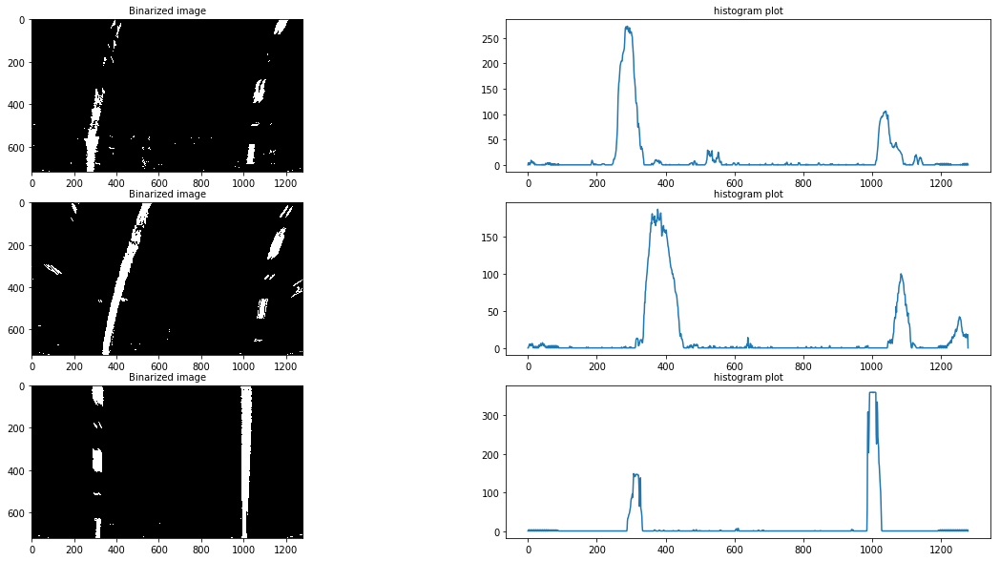

In [12]:

images_path = 'test_images/*.jpg'
images_list = glob.glob(images_path)
images_list = images_list[0:3] #limit the number of histogram ploting test, comment this line to see result for all images
f, axes= plt.subplots(len(images_list),2,figsize=(20,10))


for counter, fname in enumerate(images_list):
    img = cv2.imread(fname)
    binary_warped = image_preprocessing(img)
    axes[counter, 0].set_title('Binarized image', fontsize=10)
    axes[counter, 0].imshow(binary_warped*255, cmap='gray')
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    axes[counter, 1].set_title('histogram plot', fontsize=10)
    axes[counter, 1].plot(histogram)

After taking histogram in first horizontal half of image we localize the maximum of histogram in each half of histogram matrix. These points are the center of seaarch window at the begining of lane line pixel detection. We set 9 horizontal slice and search for pixels inside the window and if the number of depicted pixels in the window is more than 50 then the window center will be relocalized. We keep perform this step for all 9 slice of image from bottom to top of image.

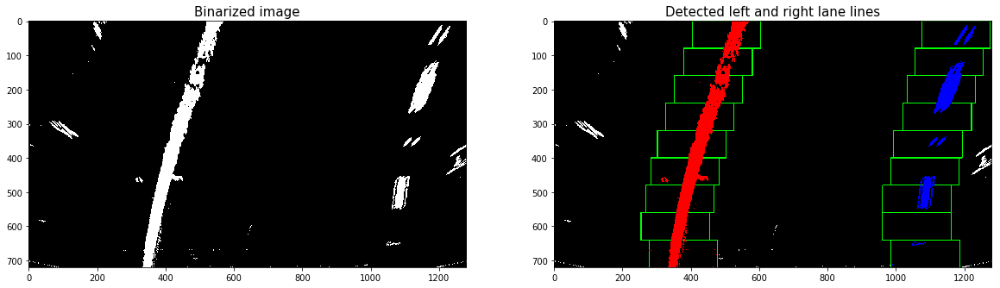

In [13]:
img = cv2.imread('test_images/test6.jpg')
binary_warped = image_preprocessing(img)
#visualization
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 160

# Set height of windows - based on nwindows above and image shape
window_height = np.int(binary_warped.shape[0]//nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated later for each window in nwindows
leftx_current = leftx_base
rightx_current = rightx_base

# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)


    # Identify the nonzero pixels in x and y within the window #
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)

    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
# Concatenate the arrays of indices (previously was a list of lists of pixels)
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds]
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

out_img[lefty, leftx] = [255, 0, 0]
out_img[righty, rightx] = [0, 0, 255]
f, axes= plt.subplots(1,2,figsize=(20,10))
axes[0].set_title('Binarized image', fontsize=15)
axes[0].imshow(binary_warped*255, cmap="gray")

axes[1].set_title('Detected left and right lane lines', fontsize=15)
axes[1].imshow(out_img)

### Fit a polynomial
---

In [14]:
def fit_poly(leftx, lefty, rightx, righty):
    # Fit a second order polynomial to each using `np.polyfit`
    try:
        left_poly = np.polyfit(lefty, leftx, 2)
        right_poly = np.polyfit(righty, rightx, 2)
    except:
        left_poly = []
        right_poly = []
    return left_poly, right_poly

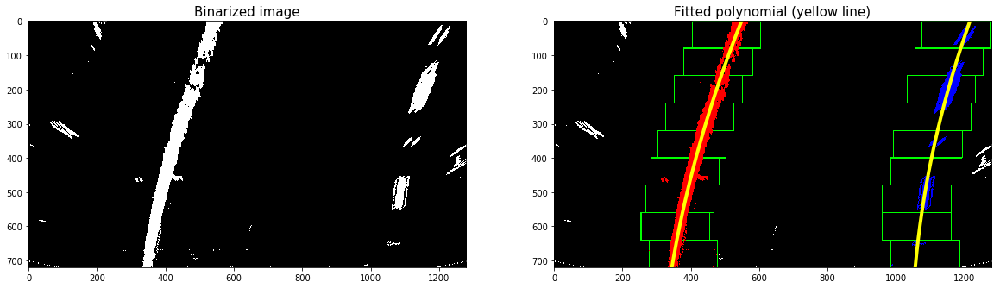

In [15]:
left_fit , right_fit = fit_poly(leftx, lefty, rightx, righty)

ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

f, axes= plt.subplots(1,2,figsize=(20,10))
axes[0].set_title('Binarized image', fontsize=15)
axes[0].imshow(binary_warped*255, cmap="gray")

axes[1].set_title('Fitted polynomial (yellow line)', fontsize=15)
axes[1].imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow',linewidth=4)
plt.plot(right_fitx, ploty, color='yellow',linewidth=4)

Text(0.5,1,'Road visualization')

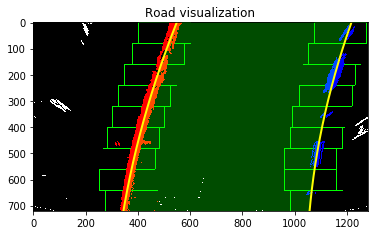

In [16]:
road_poly = np.zeros_like(img)
left_side = np.transpose(np.vstack((left_fitx, ploty)))
right_side = np.flipud(np.transpose(np.vstack((right_fitx, ploty))))
road_poly_pts = np.array([np.vstack((left_side, right_side))])
cv2.fillPoly(road_poly, np.int_(road_poly_pts), (0, 255, 0))
detected_warped = cv2.addWeighted(out_img, 1, road_poly, 0.3, 0)
plt.plot(left_fitx, ploty, color='yellow',linewidth=2)
plt.plot(right_fitx, ploty, color='yellow',linewidth=2)
plt.imshow(detected_warped)
plt.title('Road visualization')

### Radius of curvature 
---
The radius of curvature of a polynomial can be calculated using below formula:

$$R_{curve} = \frac{(1+(\frac{dx}{dy})^2)^{\frac{3}{2}}}{\frac{d^2x}{dy^2}}\;\;\;\;eq.\,1$$

Our second order polynomial can be describe as below:

$$ x = Ay^2 + By + C\;\;\;\;eq.\,2$$

Replacing $eq.\,2$ in $eq.\,1$ results in $eq.\,3$:

$$ R_{curve} = \frac{(1+ (2Ay+B)^2)^{\frac{3}{2}}}{{|2A|}}$$

In our case we need to give the equation the highest y as it is the bottom pixel of picture, where is the nearest place to the car, that we like to find the Radius of curvature.

Text(550,600,'Radius of right line: 896.72m')

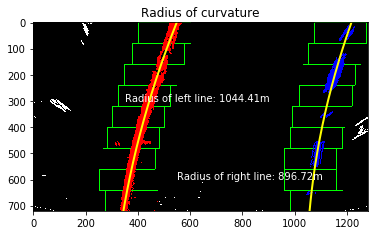

In [17]:
xm_per_pixel = 3.7/700
ym_per_pixel = 30/720
ym = ploty * ym_per_pixel

left_xm =  left_fitx * xm_per_pixel
left_fitxm = np.polyfit(ym, left_xm, 2)

right_xm =  right_fitx * xm_per_pixel
right_fitxm = np.polyfit(ym, right_xm, 2)

y_eval = np.max(ym)
left_line_radius_of_curvature = ((1 + (2*left_fitxm[0]*y_eval + left_fitxm[1])**2)**1.5)/(2*left_fitxm[0])
right_line_radius_of_curvature = ((1 + (2*right_fitxm[0]*y_eval + right_fitxm[1])**2)**1.5)/(2*right_fitxm[0])
plt.imshow(out_img)
plt.title('Radius of curvature')
plt.plot(left_fitx, ploty, color='yellow',linewidth=2)
plt.plot(right_fitx, ploty, color='yellow',linewidth=2)
plt.text(350,300, "Radius of left line: {:.2f}m".format(left_line_radius_of_curvature), color=(1,1,1))
plt.text(550,600, "Radius of right line: {:.2f}m".format(right_line_radius_of_curvature), color=(1,1,1))

### Position of the vehicle
---
The position of the vehicle that we will call it offsetwill be the difference of midle point of bottom of image and the corresponding midle point of 2 polynomial at the bottom of the image. Minus means the vehicle is closer to left line and the positive means the vehicle is closer to the right line.

Text(600,400,'Offset is: -31 cm')

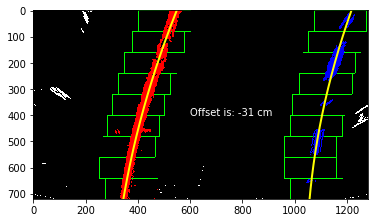

In [18]:
y_bottom = out_img.shape[0]
leftx_bottom = left_fit[0]*y_bottom**2 + left_fit[1]*y_bottom +left_fit[2]
rightx_bottom = right_fit[0]*y_bottom**2 + right_fit[1]*y_bottom +right_fit[2]
center_of_lane_lines = (leftx_bottom + rightx_bottom)//2
center_of_car = out_img.shape[1]//2
offset = (center_of_car - center_of_lane_lines)* xm_per_pixel
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow',linewidth=2)
plt.plot(right_fitx, ploty, color='yellow',linewidth=2)
plt.text(600,400, "Offset is: {} cm".format(np.int(offset*100)), color=(1,1,1))

### Inverse the warp transform
---

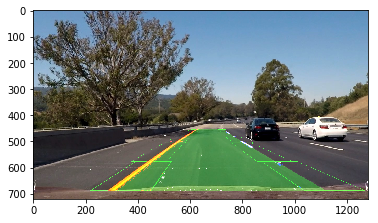

In [19]:
detected_unwarped = cv2.warpPerspective(detected_warped, Minv, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
result_image = cv2.addWeighted(img[:,:,::-1], 1, detected_unwarped, 1, 0)
plt.imshow(result_image)

### Search around polynomial
---

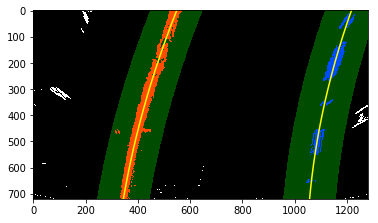

In [20]:
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty +left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
# Choose the width of the margin around the previous polynomial to search
margin = 100

# Grab activated pixels
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

left_lane_inds = []
right_lane_inds = []
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy +
                left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) +
                left_fit[1]*nonzeroy + left_fit[2] + margin)))
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy +
                right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) +
                right_fit[1]*nonzeroy + right_fit[2] + margin)))

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds]
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]


## Visualization ##
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[lefty, leftx] = [255, 0, 0]
out_img[righty, rightx] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                          ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                          ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
# Plot the polynomial lines onto the image
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
## End visualization steps ##

### Pipeline and Video Processing
---

In [21]:
class Line():
    def __init__(self, y_size, x_size):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None
        #polynomial coefficientsof the last n fits of the line
        self.recent_fitted_poly = []
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        #x values for detected line pixels
        self.allx = None
        #y values for detected line pixels
        self.ally = None
        self.ploty = np.linspace(0, y_size-1, y_size)
        self.center_point = np.int(x_size/2)
        
    def get_newline(self, new_fit, allx, ally):
        if len(new_fit) == 0:
            self.detected = False
            self.current_fit = [np.array([False])]
            self.diffs = np.array([0,0,0], dtype='float')
            self.allx = None
            self.ally = None
            self.recent_fitted_poly = self.recent_fitted_poly[1::]
            self.best_fit = np.average(np.array(self.recent_fitted_poly), axis=0)

            new_fitx = (self.best_fit[0]*self.ploty**2 + self.best_fit[1]*self.ploty + self.best_fit[2])

            self.recent_xfitted = self.recent_xfitted[1::]
            self.bestx = np.average(np.array(self.recent_xfitted), axis=0)
            ym = self.ploty * ym_per_pixel
            xm = self.bestx * xm_per_pixel
            fitted_m = np.polyfit(ym, xm, 2)
            y_eval = np.max(ym)
            self.radius_of_curvature = ((1 + (2*fitted_m[0]*y_eval + fitted_m[1])**2)**1.5)/(2*fitted_m[0])
            self.line_base_pos = np.absolute(self.center_point - self.bestx[-1]) * xm_per_pixel
        else:
            self.detected = True
            self.diffs = self.current_fit - new_fit
            self.current_fit = new_fit
            self.allx = allx
            self.ally = ally
            if len(self.recent_fitted_poly) == 10:
                self.recent_fitted_poly = self.recent_fitted_poly[1::]

            self.recent_fitted_poly.append(new_fit)
            self.best_fit = np.average(np.array(self.recent_fitted_poly), axis=0)

            new_fitx = (self.best_fit[0]*self.ploty**2 + self.best_fit[1]*self.ploty + self.best_fit[2])

            if len(self.recent_xfitted) == 10:
                self.recent_xfitted = self.recent_xfitted[1::]
            self.recent_xfitted.append(new_fitx)
            self.bestx = np.average(np.array(self.recent_xfitted), axis=0)
            ym = self.ploty * ym_per_pixel
            xm = self.bestx * xm_per_pixel
            fitted_m = np.polyfit(ym, xm, 2)
            y_eval = np.max(ym)
            self.radius_of_curvature = ((1 + (2*fitted_m[0]*y_eval + fitted_m[1])**2)**1.5)/(2*fitted_m[0])
            self.line_base_pos = np.absolute(self.center_point - self.bestx[-1]) * xm_per_pixel
        return self

In [22]:
def warp_image(image):
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    warped = cv2.warpPerspective(dst, M, (dst.shape[1],dst.shape[0]), flags=cv2.INTER_LINEAR)
    return warped

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 160

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin



        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        print('The function failed to find indices!')

        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    return leftx, lefty, rightx, righty

def search_around_poly(binary_warped, left_poly, right_poly):
    # Choose the width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_lane_inds = []
    right_lane_inds = []
    left_lane_inds = ((nonzerox > (left_poly[0]*(nonzeroy**2) + left_poly[1]*nonzeroy +
                    left_poly[2] - margin)) & (nonzerox < (left_poly[0]*(nonzeroy**2) +
                    left_poly[1]*nonzeroy + left_poly[2] + margin)))
    right_lane_inds = ((nonzerox > (right_poly[0]*(nonzeroy**2) + right_poly[1]*nonzeroy +
                    right_poly[2] - margin)) & (nonzerox < (right_poly[0]*(nonzeroy**2) +
                    right_poly[1]*nonzeroy + right_poly[2] + margin)))

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty

def find_path(binary_warped, left_poly, right_poly):
    try:
        leftx, lefty, rightx, righty = search_around_poly(binary_warped, left_poly, right_poly)
    except:
        leftx, lefty, rightx, righty = find_lane_pixels(binary_warped)
        pass
    return leftx, lefty, rightx, righty

def path_visualization(frame, Minv, left_line, right_line):
    left_poly = left_line.best_fit
    right_poly = right_line.best_fit
    leftx = left_line.allx
    lefty = left_line.ally
    rightx = right_line.allx
    righty = right_line.ally
    ploty = right_line.ploty


    left_fitx = left_poly[0]*ploty**2 + left_poly[1]*ploty + left_poly[2]
    right_fitx = right_poly[0]*ploty**2 + right_poly[1]*ploty + right_poly[2]

    road_poly = np.zeros_like(frame)
    left_side = np.transpose(np.vstack((left_fitx, ploty)))
    right_side = np.flipud(np.transpose(np.vstack((right_fitx, ploty))))
    road_poly_pts = np.array([np.vstack((left_side, right_side))])
    if (left_line.detected & right_line.detected) == True:
        cv2.fillPoly(road_poly, np.int_(road_poly_pts), (0, 255, 0))
    else:
        cv2.fillPoly(road_poly, np.int_(road_poly_pts), (0, 0, 255))

    img = np.zeros_like(frame)
    # Colors in the left and right lane regions
    img[lefty, leftx] = [255, 0, 0]
    img[righty, rightx] = [0, 0, 255]
    img = cv2.addWeighted(img, 1, road_poly, 1, 0)
    unwarped = cv2.warpPerspective(img, Minv, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)

    out_image = cv2.addWeighted(frame, 1, unwarped, 0.3, 0)
    
    radius_of_curvature = (right_line.radius_of_curvature + left_line.radius_of_curvature)/2
    cv2.putText(out_image, "Radius of curvature:  {:.2f}m".format(radius_of_curvature), (200,200), cv2.FONT_HERSHEY_SIMPLEX , 1.5, (0,0,200),2)
    cv2.putText(out_image, "Center offset:        {:.0f}cm ".format(100*left_line.line_base_pos-185), (200,250), cv2.FONT_HERSHEY_SIMPLEX , 1.5, (255,0,255),2)

    return out_image

def pipeline(frame):
    image = frame[:,:,::-1] #rgb2bgr
    binary_img = binary_image(image)
    warped_img = warp_image(binary_img)
    leftx, lefty, rightx, righty = find_path(warped_img, left_line.current_fit, right_line.current_fit)
    left_fit, right_fit = fit_poly(leftx, lefty, rightx, righty)

    left_line.get_newline(left_fit, leftx, lefty)
    right_line.get_newline(right_fit, rightx, righty)

    out_img = path_visualization(frame, Minv, left_line, right_line)
    
    return out_img

In [23]:
# create left and right lines objects
left_line = Line(720,1280)
right_line = Line(720,1280)
# capture video file
output_video = 'output_videos/output_video.mp4'
project_clip = VideoFileClip('project_video.mp4')
white_clip = project_clip.fl_image(pipeline)
%time white_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_videos/output_video.mp4
[MoviePy] Writing video output_videos/output_video.mp4


100%|█████████▉| 1260/1261 [04:05<00:00,  5.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/output_video.mp4 

CPU times: user 2min 1s, sys: 2.66 s, total: 2min 4s
Wall time: 4min 8s


In [24]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('output_videos/output_video.mp4'))

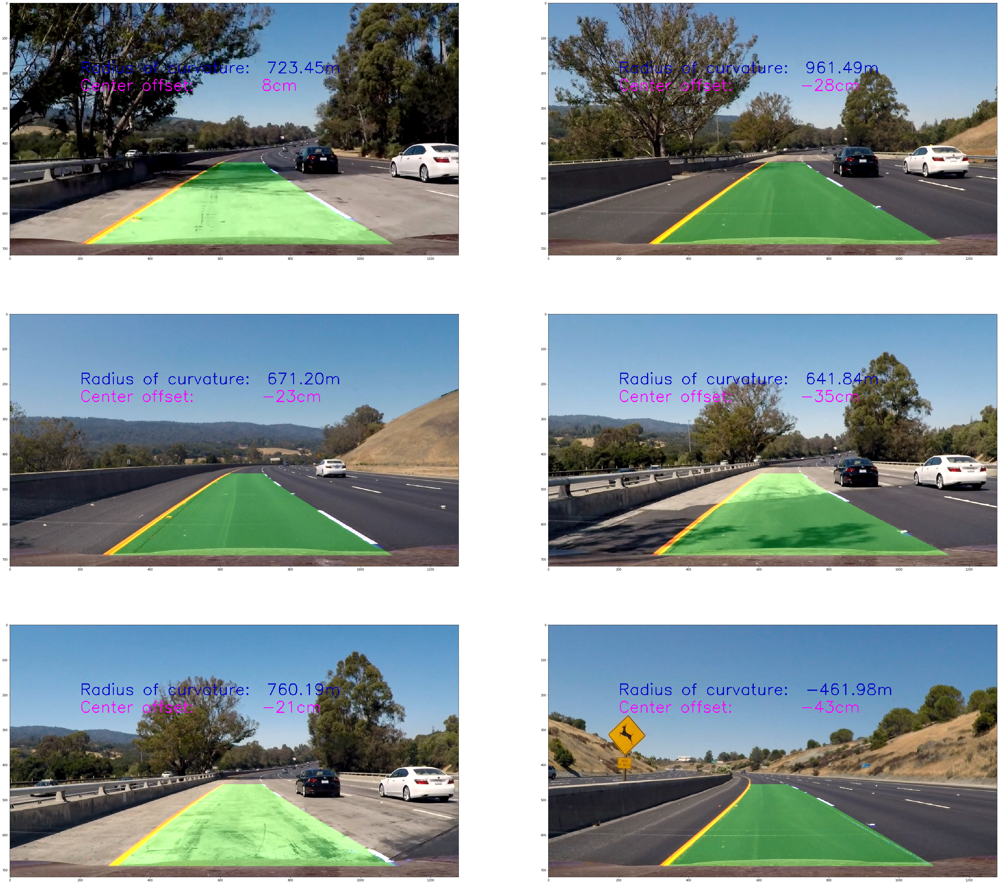

In [25]:
images = glob.glob('test_images/test*.jpg')
f, axes = plt.subplots(3,2, figsize=(60, 55))
for counter, img_path in enumerate(images):
    img = plt.imread(img_path)
    left_line = Line(720,1280)
    right_line = Line(720,1280)
    output_img = pipeline(img)
    plt.imsave('output_images/test{}.jpg'.format(counter+1),output_img)
    axes[counter//2, counter%2].imshow(output_img)